_ELMED219-2022_. Alexander S. Lundervold, 08.01.2022.

# Introduction

<img width=40% src="https://github.com/MMIV-ML/ELMED219-2022/raw/main/Lab1-EHR/assets/hospital.png">

In this notebook we'll have a look at how machine learning can be used on electronic health records data through a (small and simplified) example.

From data gathered from 100.000 patients, collected by Microsoft here https://microsoft.github.io/r-server-hospital-length-of-stay/index.html, we will try to predict the length of stay of patients admitted to various departments at hospital. Such a system (if it was sufficiently robust and accurate) would be extremely valuable. For hospital resource management, i.e. managing personnel and planning for patient discharge at hospital departments.

By investigating what features have the largest explanatory power for a trained machine learning model, such a system could also potentially uncover interesting connections / hypotheses linking journal data and patient conditions.

# Setup

We start by importing our standard libraries for exploratory data analysis and machine learning:

In [1]:
%matplotlib inline
from pathlib import Path
import numpy as np
import pandas as pd
pd.set_option("display.max_columns", 100)

import matplotlib.pyplot as plt
import seaborn as sns

import sklearn

In [2]:
# This is a quick check of whether the notebook is currently running 
# on Google Colaboratory
if 'google.colab' in str(get_ipython()):
    print('The notebook is running on Colab. colab=True.')
    colab=True
    !pip install -U openpyxl  # To read pickle file with protocol=3 (hospital.pkl)
else:
    print('The notebook is not running on Colab. colab=False.')
    colab=False

The notebook is not running on Colab. colab=False.


# Load and inspect the data

The data set consists of three files:


In [3]:
LOS = pd.read_pickle('https://github.com/MMIV-ML/ELMED219-2022/raw/main/Lab1-EHR/data/hospital.pkl')
DICT = pd.read_excel('https://github.com/MMIV-ML/ELMED219-2022/raw/main/Lab1-EHR/data/Data_Dictionary.xlsx')
METADATA = pd.read_csv('https://raw.githubusercontent.com/MMIV-ML/ELMED219-2022/main/Lab1-EHR/data/MetaData_Facilities.csv')

Let's have a look at what we downloaded:

In [4]:
LOS.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                      Non-Null Count   Dtype         
---  ------                      --------------   -----         
 0   eid                         100000 non-null  int64         
 1   vdate                       100000 non-null  datetime64[ns]
 2   rcount                      100000 non-null  int64         
 3   gender                      100000 non-null  object        
 4   dialysisrenalendstage       100000 non-null  bool          
 5   asthma                      100000 non-null  bool          
 6   irondef                     100000 non-null  bool          
 7   pneum                       100000 non-null  bool          
 8   substancedependence         100000 non-null  bool          
 9   psychologicaldisordermajor  100000 non-null  bool          
 10  depress                     100000 non-null  bool          
 11  psychother                  100000 non-n

In [5]:
LOS.head()

,eid,vdate,rcount,gender,dialysisrenalendstage,asthma,irondef,pneum,substancedependence,psychologicaldisordermajor,depress,psychother,fibrosisandother,malnutrition,hemo,hematocrit,neutrophils,sodium,glucose,bloodureanitro,creatinine,bmi,pulse,respiration,secondarydiagnosisnonicd9,discharged,facid,lengthofstay
0,1,2012-08-29,0,F,False,False,False,False,False,False,False,False,False,False,False,11.5,14.20,140.361132,192.476918,12.0,1.390722,30.432418,96,6.5,4,2012-09-01,B,3
1,2,2012-05-26,5,F,False,False,False,False,False,False,False,False,False,False,False,9.0,4.10,136.731692,94.078507,8.0,0.943164,28.460516,61,6.5,1,2012-06-02,A,7
2,3,2012-09-22,1,F,False,False,False,False,False,False,False,False,False,False,False,8.4,8.90,133.058514,130.530524,12.0,1.065750,28.843812,64,6.5,2,2012-09-25,B,3
3,4,2012-08-09,0,F,False,False,False,False,False,False,False,False,False,False,False,11.9,9.40,138.994023,163.377028,12.0,0.906862,27.959007,76,6.5,1,2012-08-10,A,1
4,5,2012-12-20,0,F,False,False,False,True,False,True,False,False,False,False,False,9.1,9.05,138.634836,94.886654,11.5,1.242854,30.258927,67,5.6,2,2012-12-24,E,4


In [6]:
DICT

,Index,Data fields,Type,Descriptions
0,NaN,LengthOfStay,NaN,NaN
1,1.0,eid,Integer,Unique Id of the hospital admission
2,2.0,vdate,String,Visit date
3,3.0,rcount,Integer,Number of readmissions within last 180 days
4,4.0,gender,String,Gender of the patient\nM or F
5,5.0,dialysisrenalendstage,String,Flag for renal disease during encounter
6,6.0,asthma,String,Flag for asthma during encounter
7,7.0,irondef,String,Flag for iron deficiency during encounter
8,8.0,pneum,String,Flag for pneumonia during encounter
9,9.0,substancedependence,String,Flag for substance dependence during encounter


In [7]:
METADATA

,Capacity,Id,Name
0,30,C,General Medicine 3 South
1,95,E,Behavioral 1 East
2,75,A,General Medicine 3 West
3,80,B,Pulmonary 2 West
4,100,D,Geriatrics 2 East


## Some simple observations



It seems that `LOS` is our main source of information. `DICT` provides useful information about the features in `LOS`, while `METADATA` contains information about the various hospital departments the data is collected from.

> Note that `rcount = 5` means 5 _or more_ visits over the past 180 days.

# Plots and further exploration

What is the distribution of length of stay?

In [8]:
LOS_value_count = LOS['lengthofstay'].value_counts()
LOS_value_count

1     17979
3     16068
4     14822
2     12825
5     12116
6     10362
7      7263
8      4652
9      2184
10     1000
11      460
12      137
13       75
14       31
15       16
16        6
17        4
Name: lengthofstay, dtype: int64

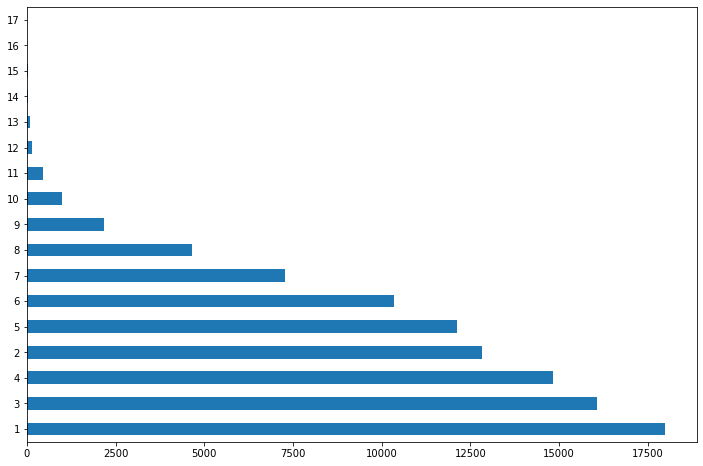

In [9]:
LOS_value_count.plot.barh(figsize=(12,8))
plt.show()

We note that the data set is pretty imbalanced. Most of the stays at the hospital are short. 

What's the gender distribution

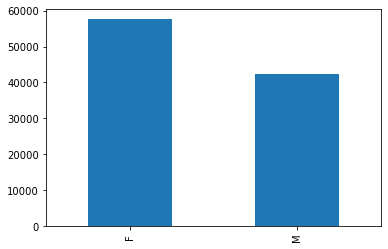

In [10]:
gender_counts = LOS['gender'].value_counts()
gender_counts.plot.bar()
plt.show()

Slightly more women than men. 

Is there a difference in how long they stay at the hospital?

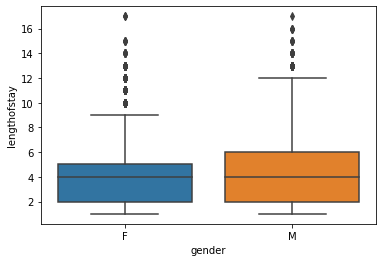

In [11]:
# Box plot:
ax = sns.boxplot(x='gender', y='lengthofstay', data=LOS)

Most patients haven't been to the hospital during the last 180 days, but some are frequent guests:

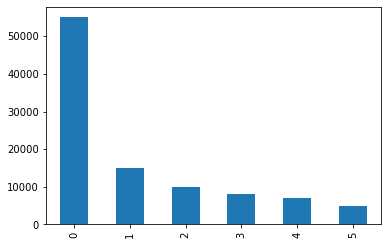

In [12]:
LOS['rcount'].value_counts().plot.bar()
plt.show()

Does the number of visits differ between men and women in this data set?

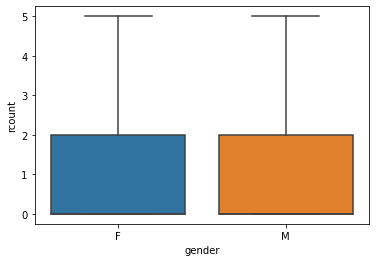

In [13]:
ax = sns.boxplot(x='gender', y='rcount', data=LOS)

To what departments are the patients admitted?

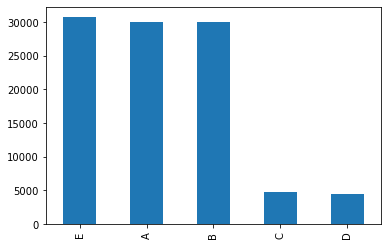

In [14]:
facid_counts = LOS['facid'].value_counts()
facid_counts.plot.bar()
plt.show()

In [15]:
METADATA

,Capacity,Id,Name
0,30,C,General Medicine 3 South
1,95,E,Behavioral 1 East
2,75,A,General Medicine 3 West
3,80,B,Pulmonary 2 West
4,100,D,Geriatrics 2 East


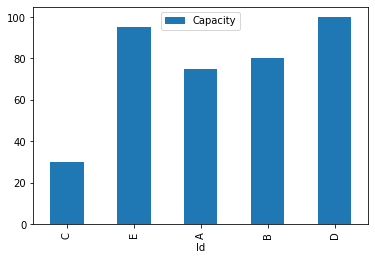

In [16]:
METADATA.plot(x='Id', y='Capacity', kind='bar')
plt.show()

One would guess some departments see patients with certain issues more than others. What about asthma for example?

In [17]:
LOS.head()

,eid,vdate,rcount,gender,dialysisrenalendstage,asthma,irondef,pneum,substancedependence,psychologicaldisordermajor,depress,psychother,fibrosisandother,malnutrition,hemo,hematocrit,neutrophils,sodium,glucose,bloodureanitro,creatinine,bmi,pulse,respiration,secondarydiagnosisnonicd9,discharged,facid,lengthofstay
0,1,2012-08-29,0,F,False,False,False,False,False,False,False,False,False,False,False,11.5,14.20,140.361132,192.476918,12.0,1.390722,30.432418,96,6.5,4,2012-09-01,B,3
1,2,2012-05-26,5,F,False,False,False,False,False,False,False,False,False,False,False,9.0,4.10,136.731692,94.078507,8.0,0.943164,28.460516,61,6.5,1,2012-06-02,A,7
2,3,2012-09-22,1,F,False,False,False,False,False,False,False,False,False,False,False,8.4,8.90,133.058514,130.530524,12.0,1.065750,28.843812,64,6.5,2,2012-09-25,B,3
3,4,2012-08-09,0,F,False,False,False,False,False,False,False,False,False,False,False,11.9,9.40,138.994023,163.377028,12.0,0.906862,27.959007,76,6.5,1,2012-08-10,A,1
4,5,2012-12-20,0,F,False,False,False,True,False,True,False,False,False,False,False,9.1,9.05,138.634836,94.886654,11.5,1.242854,30.258927,67,5.6,2,2012-12-24,E,4


Patients with asthma:


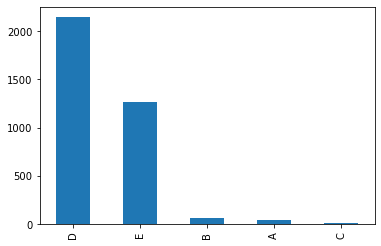

In [18]:
print("Patients with asthma:")
ax = LOS.loc[LOS['asthma'] == True]['facid'].value_counts().plot.bar()

Patients with major psychological disorders:


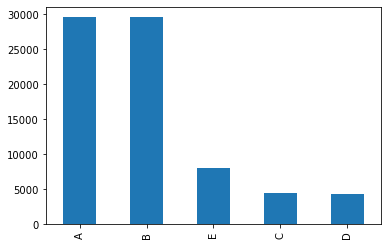

In [19]:
print("Patients with major psychological disorders:")
ax = LOS.loc[LOS['psychologicaldisordermajor'] == False]['facid'].value_counts().plot.bar()

How long did they stay at the different departments?

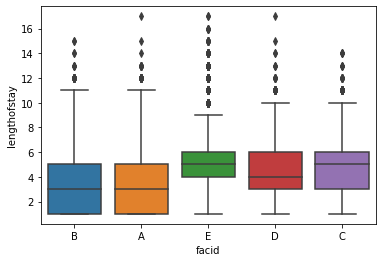

In [20]:
ax = sns.boxplot(x='facid', y='lengthofstay', data=LOS)

## Correlations

How do the numerical features correlate to length of stay?

Here's the feature descriptions again:

In [21]:
DICT

,Index,Data fields,Type,Descriptions
0,NaN,LengthOfStay,NaN,NaN
1,1.0,eid,Integer,Unique Id of the hospital admission
2,2.0,vdate,String,Visit date
3,3.0,rcount,Integer,Number of readmissions within last 180 days
4,4.0,gender,String,Gender of the patient\nM or F
5,5.0,dialysisrenalendstage,String,Flag for renal disease during encounter
6,6.0,asthma,String,Flag for asthma during encounter
7,7.0,irondef,String,Flag for iron deficiency during encounter
8,8.0,pneum,String,Flag for pneumonia during encounter
9,9.0,substancedependence,String,Flag for substance dependence during encounter


We check the correlations with `lengthofstay`:

In [22]:
correlation_matrix = LOS.corr()
correlation_matrix['lengthofstay'].sort_values(ascending=False)

lengthofstay                  1.000000
rcount                        0.749514
psychologicaldisordermajor    0.286724
hemo                          0.217696
irondef                       0.193838
psychother                    0.191695
malnutrition                  0.174397
dialysisrenalendstage         0.169695
bloodureanitro                0.148290
substancedependence           0.147886
pneum                         0.135461
depress                       0.121408
asthma                        0.082005
fibrosisandother              0.062131
pulse                         0.006683
secondarydiagnosisnonicd9     0.006540
eid                           0.001543
bmi                           0.000132
glucose                      -0.003447
sodium                       -0.003546
creatinine                   -0.004026
neutrophils                  -0.010658
respiration                  -0.022291
hematocrit                   -0.064016
Name: lengthofstay, dtype: float64

## Observations

- `rcount` is highly correlated to length of stay. The number of hospital visits during the last 180 days says a lot about expected length of stay. 
- `facid` is also quite correlated. That could be caused by varying capacity of the different departments, and the different patient population they serve.

> **Your turn!** There are many more questions we could ask of the data. For example, do people with certain issues visit the hospital more than others? Are there certain times of the year that see more patients with certain issues? You'll no doubt think of additional questions. Feel free to try to answer them as we did above!

## Extra: further data inspection

In [23]:
from pandas_profiling import ProfileReport

In [24]:
ProfileReport(LOS, explorative=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Let's try to make a predictive model

We simplify a bit and treat it as a classification problem:


We disregard the dates in the data set:

In [25]:
LOS.drop(['vdate', 'discharged'], axis=1, inplace=True)

...and represent the genders and facility IDs numerically:

In [26]:
LOS.facid.value_counts()

E    30755
A    30035
B    30012
C     4699
D     4499
Name: facid, dtype: int64

In [27]:
LOS['facid'] = LOS['facid'].replace({'A':0, 'B':1, 'C': 2, 'D': 3, 'E':4})
LOS['gender'] = LOS['facid'].replace({'F':0, 'M':1})

In [28]:
LOS.head()

,eid,rcount,gender,dialysisrenalendstage,asthma,irondef,pneum,substancedependence,psychologicaldisordermajor,depress,psychother,fibrosisandother,malnutrition,hemo,hematocrit,neutrophils,sodium,glucose,bloodureanitro,creatinine,bmi,pulse,respiration,secondarydiagnosisnonicd9,facid,lengthofstay
0,1,0,1,False,False,False,False,False,False,False,False,False,False,False,11.5,14.20,140.361132,192.476918,12.0,1.390722,30.432418,96,6.5,4,1,3
1,2,5,0,False,False,False,False,False,False,False,False,False,False,False,9.0,4.10,136.731692,94.078507,8.0,0.943164,28.460516,61,6.5,1,0,7
2,3,1,1,False,False,False,False,False,False,False,False,False,False,False,8.4,8.90,133.058514,130.530524,12.0,1.065750,28.843812,64,6.5,2,1,3
3,4,0,0,False,False,False,False,False,False,False,False,False,False,False,11.9,9.40,138.994023,163.377028,12.0,0.906862,27.959007,76,6.5,1,0,1
4,5,0,4,False,False,False,True,False,True,False,False,False,False,False,9.1,9.05,138.634836,94.886654,11.5,1.242854,30.258927,67,5.6,2,4,4



> Is the expected length of stay 1, 2, 3, 4, 5, 6, 7, 8 or more than 8 days?

In [29]:
LOS.lengthofstay.value_counts()

1     17979
3     16068
4     14822
2     12825
5     12116
6     10362
7      7263
8      4652
9      2184
10     1000
11      460
12      137
13       75
14       31
15       16
16        6
17        4
Name: lengthofstay, dtype: int64

In [30]:
# Let's make a copy of the original LOS data before deleting 
# the longer stays
LOS_all = LOS.copy()

In [31]:
LOS.lengthofstay.value_counts()

1     17979
3     16068
4     14822
2     12825
5     12116
6     10362
7      7263
8      4652
9      2184
10     1000
11      460
12      137
13       75
14       31
15       16
16        6
17        4
Name: lengthofstay, dtype: int64

In [32]:
LOS['lengthofstay'][ LOS['lengthofstay'] > 7 ] = 8

/var/folders/y0/6krmxw152qjflvfhkn0bn4r40000gn/T/ipykernel_3393/3449951318.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  LOS['lengthofstay'][ LOS['lengthofstay'] > 7 ] = 8


In [33]:
LOS.lengthofstay.value_counts()

1    17979
3    16068
4    14822
2    12825
5    12116
6    10362
8     8565
7     7263
Name: lengthofstay, dtype: int64

> It's also possible to try to classify among all the different length of stays in the data set. You could also treat it as a regression rather than a classification problem. Feel free to try!

In [34]:
X = LOS.drop(['lengthofstay', 'eid'], axis=1)
y = LOS['lengthofstay']

## Separate a test set

To simulate the real situation where our model is used to predict length of stay as a new patient arrives, we set aside a test set to evaluate the model.

In [35]:
from sklearn.model_selection import train_test_split

We used stratified splitting (`stratify=y` below) to ensure that the length of stay distribution is the same in the training and test sets.

In [36]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)

In [37]:
len(X_train), len(X_test)

(75000, 25000)

<AxesSubplot:>

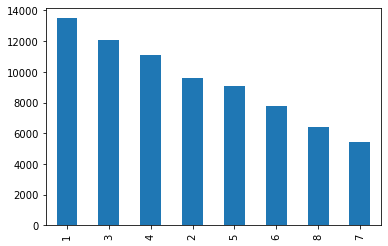

In [38]:
y_train.value_counts().plot.bar()

<AxesSubplot:>

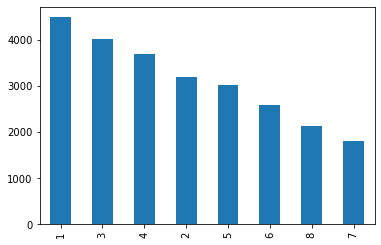

In [39]:
y_test.value_counts().plot.bar()

## Select a model

We'll try a random forest classifier:

In [40]:
from sklearn.ensemble import RandomForestClassifier

In [41]:
rf = RandomForestClassifier(random_state=42, n_jobs=-1) 
# n_jobs=-1 to use all available CPUs on the computer.

We train the model:

In [42]:
rf.fit(X_train, y_train)

RandomForestClassifier(n_jobs=-1, random_state=42)

...and compute its accuracy on the test data:

In [43]:
from sklearn.metrics import accuracy_score

In [44]:
y_pred = rf.predict(X_test)

In [45]:
accuracy_score(y_test, y_pred)

0.68348

The model predicts the length of stay on the test data with an accuracy of about 68%.

# Evaluating the result

Is this a good result? What features are used by the model in making its predictions?

## Confusion matrix

Confusion matrices are very useful tools when evaluating classifiers. They simply count the number of correct classifications and the number of misclassifications of all kinds:

/var/folders/y0/6krmxw152qjflvfhkn0bn4r40000gn/T/ipykernel_3393/3891664849.py:4: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


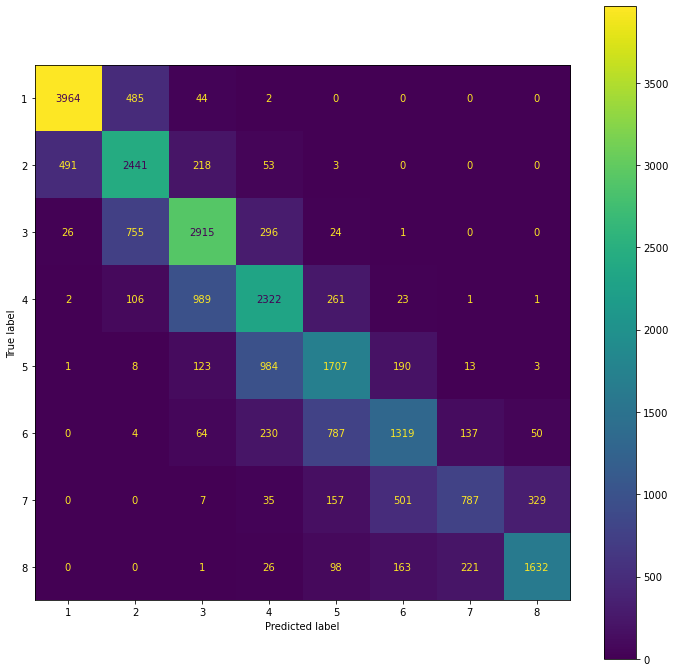

In [46]:
from sklearn.metrics import ConfusionMatrixDisplay
fig, ax = plt.subplots(figsize=(12,12))
disp = ConfusionMatrixDisplay.from_estimator(rf, X_test, y_test, ax=ax)
plt.show()

## Feature importance

We know that looking at feature importance can be useful:

In [47]:
importances = rf.feature_importances_
# Find index of those with highest importance, sorted from largest to smallest:
indices = np.argsort(importances)[::-1]
for f in range(X.shape[1]): 
    print(f'{X.columns[indices[f]]}: {np.round(importances[indices[f]],2)}')

rcount: 0.23
bmi: 0.08
glucose: 0.08
sodium: 0.08
creatinine: 0.08
pulse: 0.07
hematocrit: 0.07
neutrophils: 0.06
respiration: 0.04
bloodureanitro: 0.04
secondarydiagnosisnonicd9: 0.03
gender: 0.03
facid: 0.03
psychologicaldisordermajor: 0.02
hemo: 0.01
irondef: 0.01
substancedependence: 0.01
depress: 0.01
dialysisrenalendstage: 0.01
asthma: 0.0
pneum: 0.0
malnutrition: 0.0
psychother: 0.0
fibrosisandother: 0.0


/var/folders/y0/6krmxw152qjflvfhkn0bn4r40000gn/T/ipykernel_3393/3997260070.py:4: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


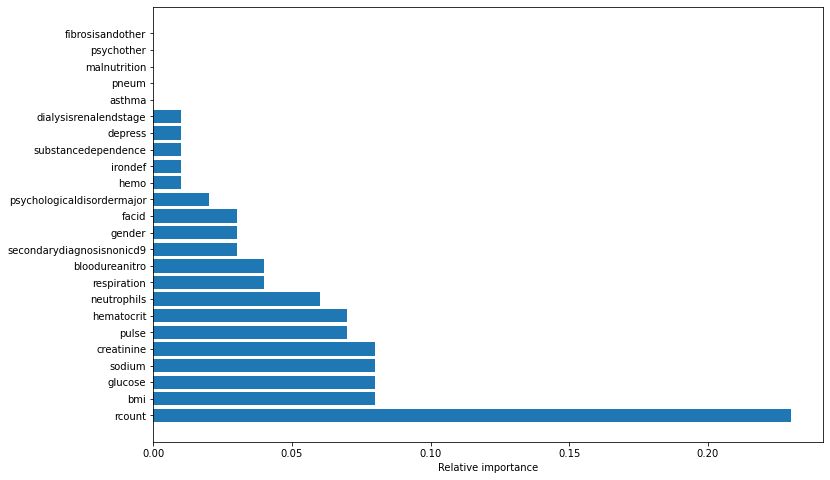

In [48]:
f, ax = plt.subplots(figsize=(12,8))
plt.barh(X.columns[indices], np.round(importances[indices],2))
plt.xlabel("Relative importance")
plt.show()

We notice that the model depends quite a bit on the `rcount` feature. That's not very surprising considering the correlations we found above.

As we remember from Lab 0, one shouldn't trust this way of computing feature importance. It's better to use a more data-driven technique, like for example **permutation importance**.

## Permutation importance

We recall from Lab 0 that the idea of permutation importance is that if a feature is important for the model then a random shuffling of the data in the corresponding column would result in a drastic deterioration of the model performance. If a feature is unimportant, then such shuffling wouldn't matter much. 

Let's try:

In [49]:
from sklearn.inspection import permutation_importance

In [50]:
r = permutation_importance(rf, X_test, y_test,
                            n_repeats=30,
                            random_state=0)

In [51]:
for i in r.importances_mean.argsort()[::-1]:
     if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
         print(f"{X_test.columns[i]:<8}"
               f"{r.importances_mean[i]:.3f}"
               f" +/- {r.importances_std[i]:.3f}")

rcount  0.403 +/- 0.002
psychologicaldisordermajor0.103 +/- 0.002
hematocrit0.067 +/- 0.001
bmi     0.060 +/- 0.002
creatinine0.056 +/- 0.001
sodium  0.053 +/- 0.002
glucose 0.052 +/- 0.002
pulse   0.052 +/- 0.002
respiration0.046 +/- 0.002
hemo    0.041 +/- 0.001
neutrophils0.023 +/- 0.002
irondef 0.023 +/- 0.001
substancedependence0.017 +/- 0.001
bloodureanitro0.014 +/- 0.001
depress 0.012 +/- 0.001
facid   0.012 +/- 0.001
dialysisrenalendstage0.010 +/- 0.001
gender  0.010 +/- 0.001
asthma  0.009 +/- 0.000
pneum   0.004 +/- 0.000
malnutrition0.003 +/- 0.000
psychother0.001 +/- 0.000
fibrosisandother0.000 +/- 0.000


It's easier to see this in a plot:

/var/folders/y0/6krmxw152qjflvfhkn0bn4r40000gn/T/ipykernel_3393/652512535.py:11: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


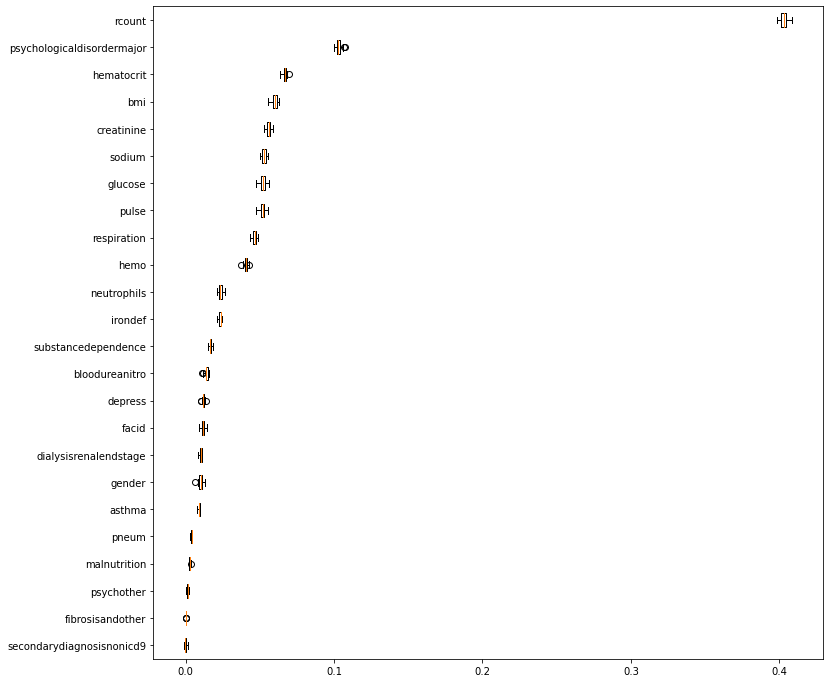

In [52]:
# Get the sorted indices of the features according to mean importance
r_sorted_idx = r.importances_mean.argsort()

# Create a boxplot
fig, ax = plt.subplots( figsize=(12, 12))
ax.boxplot(
    r.importances[r_sorted_idx].T,
    vert=False,
    labels=X_test.columns[r_sorted_idx],
)
plt.show()

We notice that the model uses `rcount` as the most important feature also here, with a significant margin. 

> **Your turn!** An hypothesis for why `psychologicaldisordermajor` is high on the list of important features is that persons with this flag set to True are special in some impactful way. For example, one may wonder whether they are often in the "Behavioral" department.. Investigate this. Investigate also any other hypotheses you may think of. 

A natural question to ask is _"If the number of visits increase, does the length of stay also increase?"_. Or the other way around? Or is there a more complicated connection between the two?

We can (partly) uncover this by using **partial dependence plots**, as introduced in Lab 0.

## Partial dependence plots

What happens to the predicted length of stay if the number of visits increases?

To answer this it is better to treat the problem as a regression problem (otherwise we would have to look at the effect of increasing the number of visit for each of the different possible length of stays).

We use the data set with all the different length of stays, and train a random forest regression model:

In [53]:
LOS_all.head()

,eid,rcount,gender,dialysisrenalendstage,asthma,irondef,pneum,substancedependence,psychologicaldisordermajor,depress,psychother,fibrosisandother,malnutrition,hemo,hematocrit,neutrophils,sodium,glucose,bloodureanitro,creatinine,bmi,pulse,respiration,secondarydiagnosisnonicd9,facid,lengthofstay
0,1,0,1,False,False,False,False,False,False,False,False,False,False,False,11.5,14.20,140.361132,192.476918,12.0,1.390722,30.432418,96,6.5,4,1,3
1,2,5,0,False,False,False,False,False,False,False,False,False,False,False,9.0,4.10,136.731692,94.078507,8.0,0.943164,28.460516,61,6.5,1,0,7
2,3,1,1,False,False,False,False,False,False,False,False,False,False,False,8.4,8.90,133.058514,130.530524,12.0,1.065750,28.843812,64,6.5,2,1,3
3,4,0,0,False,False,False,False,False,False,False,False,False,False,False,11.9,9.40,138.994023,163.377028,12.0,0.906862,27.959007,76,6.5,1,0,1
4,5,0,4,False,False,False,True,False,True,False,False,False,False,False,9.1,9.05,138.634836,94.886654,11.5,1.242854,30.258927,67,5.6,2,4,4


In [54]:
X = LOS_all.drop(['lengthofstay', 'eid'], axis=1)
y = LOS_all['lengthofstay']
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)

In [55]:
# Train a regression model
from sklearn.ensemble import RandomForestRegressor
rf_reg = RandomForestRegressor(random_state=42)
rf_reg.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

How did we do? 

In [56]:
y_pred = rf_reg.predict(X_test)

In [57]:
from sklearn.metrics import mean_absolute_error

In [58]:
mean_absolute_error(y_pred, y_test)

0.38718079999999994

We can check how increasing rcount (holding all the other features constant) affects the model's predicted length of stay:

In [59]:
from sklearn.inspection import PartialDependenceDisplay

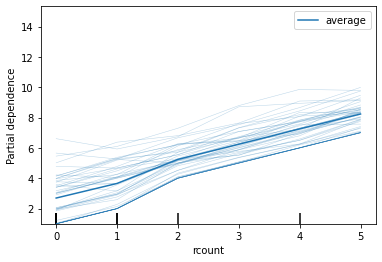

In [60]:
PartialDependenceDisplay.from_estimator(rf_reg, X_train, ['rcount'], kind='both',  subsample=50)

One could do similarly also for other features in our data set.

# Feature engineering

Some features are more important than others for our model. In other words, some features describe the patients in a more expedient way than others, and are of greater value for our predictive model.

> But these are not necessarily the best features!

One of the most important parts of machine learning (albeit often underappreciated) is **feature engineering**.

As we've learned, machine learning is, basically, about **function approximation**. You want to find a function that is as close as possible to the true function mapping from the set of features to correct label or value.

$$y \approx f(x; \theta)$$

> In general, the more _complicated_ the true function is, the harder it is for the machine learning model.

By describing the raw data with new, more suitable features it is possible to reduce the complexity of the true function. As an extreme example, if we had used the date of entry and date of exit for each of our patients then the true function could be very simple: exit minus entry equals length of stay.

There's a lot of room between doing nothing and actually put the label as a feature (which is of course not useful). That's what feature engineering is about.

The best way to do feature engineering is to influence how the data is collected. Then it's possible to add new features that one believes could be useful for modelling (for example, we could add the patient age in our example).

If you cannot influence data collection one should rather think as follows: (i) bring in external features (f.ex. if we had the patients personal identification number we could access other data bases containing more information), or (ii) create new features by combine the ones we have.

> Any real-life machine learning project will involve some feature engineering!

## Creating a new feature

Each patient is associated to a number of flags for different conditions:
```
 'dialysisrenalendstage',
 'asthma',
 'irondef',
 'pneum',
 'substancedependence',
 'psychologicaldisordermajor',
 'depress',
 'psychother',
 'fibrosisandother',
 'malnutrition',
 'hemo'
 ```

In [61]:
LOS.head()

,eid,rcount,gender,dialysisrenalendstage,asthma,irondef,pneum,substancedependence,psychologicaldisordermajor,depress,psychother,fibrosisandother,malnutrition,hemo,hematocrit,neutrophils,sodium,glucose,bloodureanitro,creatinine,bmi,pulse,respiration,secondarydiagnosisnonicd9,facid,lengthofstay
0,1,0,1,False,False,False,False,False,False,False,False,False,False,False,11.5,14.20,140.361132,192.476918,12.0,1.390722,30.432418,96,6.5,4,1,3
1,2,5,0,False,False,False,False,False,False,False,False,False,False,False,9.0,4.10,136.731692,94.078507,8.0,0.943164,28.460516,61,6.5,1,0,7
2,3,1,1,False,False,False,False,False,False,False,False,False,False,False,8.4,8.90,133.058514,130.530524,12.0,1.065750,28.843812,64,6.5,2,1,3
3,4,0,0,False,False,False,False,False,False,False,False,False,False,False,11.9,9.40,138.994023,163.377028,12.0,0.906862,27.959007,76,6.5,1,0,1
4,5,0,4,False,False,False,True,False,True,False,False,False,False,False,9.1,9.05,138.634836,94.886654,11.5,1.242854,30.258927,67,5.6,2,4,4


In [62]:
DICT

,Index,Data fields,Type,Descriptions
0,NaN,LengthOfStay,NaN,NaN
1,1.0,eid,Integer,Unique Id of the hospital admission
2,2.0,vdate,String,Visit date
3,3.0,rcount,Integer,Number of readmissions within last 180 days
4,4.0,gender,String,Gender of the patient\nM or F
5,5.0,dialysisrenalendstage,String,Flag for renal disease during encounter
6,6.0,asthma,String,Flag for asthma during encounter
7,7.0,irondef,String,Flag for iron deficiency during encounter
8,8.0,pneum,String,Flag for pneumonia during encounter
9,9.0,substancedependence,String,Flag for substance dependence during encounter


Let's make a feature that simply counts all the issues per patient. The idea is that the number of issues influences the length of stay, and if we add it as a feature we make it simpler for the model to pick up on this.

In [63]:
issues = ['dialysisrenalendstage',
 'asthma',
 'irondef',
 'pneum',
 'substancedependence',
 'psychologicaldisordermajor',
 'depress',
 'psychother',
 'fibrosisandother',
 'malnutrition',
 'hemo']

In [64]:
LOS.insert(len(LOS.columns)- 1, 'numberofissues', LOS[issues].astype('int').sum(axis=1))

In [65]:
LOS.head()

,eid,rcount,gender,dialysisrenalendstage,asthma,irondef,pneum,substancedependence,psychologicaldisordermajor,depress,psychother,fibrosisandother,malnutrition,hemo,hematocrit,neutrophils,sodium,glucose,bloodureanitro,creatinine,bmi,pulse,respiration,secondarydiagnosisnonicd9,facid,numberofissues,lengthofstay
0,1,0,1,False,False,False,False,False,False,False,False,False,False,False,11.5,14.20,140.361132,192.476918,12.0,1.390722,30.432418,96,6.5,4,1,0,3
1,2,5,0,False,False,False,False,False,False,False,False,False,False,False,9.0,4.10,136.731692,94.078507,8.0,0.943164,28.460516,61,6.5,1,0,0,7
2,3,1,1,False,False,False,False,False,False,False,False,False,False,False,8.4,8.90,133.058514,130.530524,12.0,1.065750,28.843812,64,6.5,2,1,0,3
3,4,0,0,False,False,False,False,False,False,False,False,False,False,False,11.9,9.40,138.994023,163.377028,12.0,0.906862,27.959007,76,6.5,1,0,0,1
4,5,0,4,False,False,False,True,False,True,False,False,False,False,False,9.1,9.05,138.634836,94.886654,11.5,1.242854,30.258927,67,5.6,2,4,2,4


In [66]:
LOS['numberofissues'].value_counts()

0    57341
1    23350
2    11536
3     4660
4     2018
5      773
6      261
7       46
8       12
9        3
Name: numberofissues, dtype: int64

/var/folders/y0/6krmxw152qjflvfhkn0bn4r40000gn/T/ipykernel_3393/2099390125.py:3: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


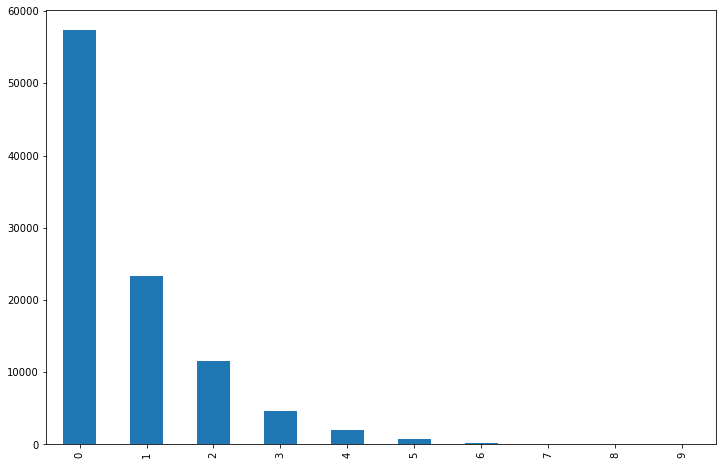

In [67]:
plt.figure(figsize=(12,8))
LOS['numberofissues'].value_counts().plot.bar()
plt.show()

> **Your turn!** Are patients with a large number of issues often at the hospital? Do they stay for long?

## Create a new model with our new feature included

In [68]:
X = LOS.drop('lengthofstay', axis=1)
y = LOS['lengthofstay']

In [69]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)

In [70]:
rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1) 

In [71]:
rf.fit(X_train, y_train)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [72]:
y_pred = rf.predict(X_test)

In [73]:
accuracy_score(y_test, y_pred)

0.70636

We are now predicting the length of stay with an accuracy of ca. 70.6%. A small improvement.

We can have a look at the feature importance and permutation importance to see how useful our new feature is:

In [74]:
importances = rf.feature_importances_
# Find index of those with highest importance, sorted from largest to smallest:
indices = np.argsort(importances)[::-1]
for f in range(X.shape[1]): 
    print(f'{X.columns[indices[f]]}: {np.round(importances[indices[f]],2)}')

rcount: 0.25
bmi: 0.08
glucose: 0.07
creatinine: 0.07
sodium: 0.07
pulse: 0.07
hematocrit: 0.06
neutrophils: 0.05
eid: 0.05
numberofissues: 0.04
respiration: 0.04
bloodureanitro: 0.03
gender: 0.02
secondarydiagnosisnonicd9: 0.02
facid: 0.02
psychologicaldisordermajor: 0.01
hemo: 0.01
irondef: 0.0
substancedependence: 0.0
depress: 0.0
dialysisrenalendstage: 0.0
psychother: 0.0
pneum: 0.0
malnutrition: 0.0
asthma: 0.0
fibrosisandother: 0.0


We note that the model relies on the new feature more heavily than any of the separate flags. 

What about permutation importance?

In [75]:
r = permutation_importance(rf, X_test, y_test,
                            n_repeats=30,
                            random_state=0)

/var/folders/y0/6krmxw152qjflvfhkn0bn4r40000gn/T/ipykernel_3393/652512535.py:11: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


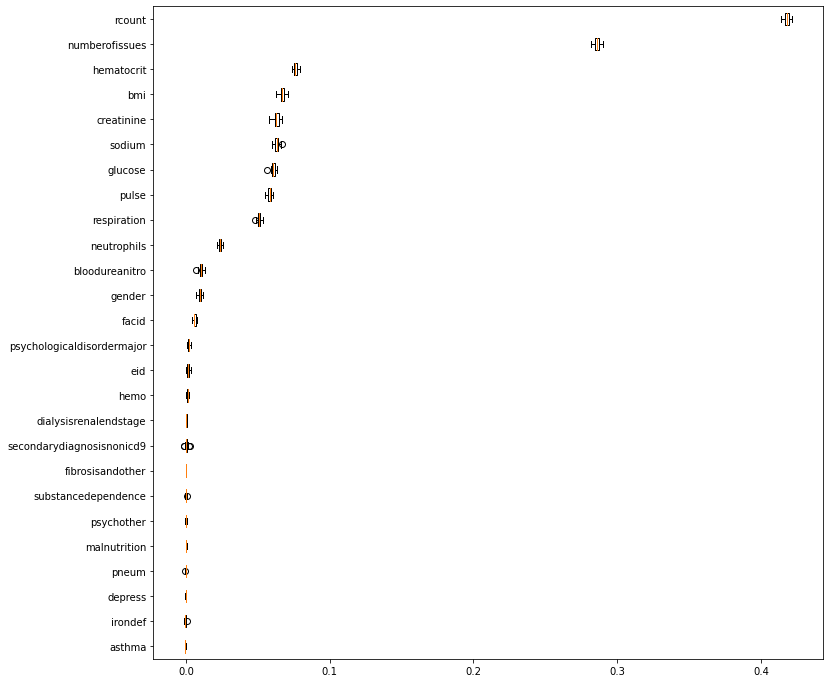

In [76]:
# Get the sorted indices of the features according to mean importance
r_sorted_idx = r.importances_mean.argsort()

# Create a boxplot
fig, ax = plt.subplots( figsize=(12, 12))
ax.boxplot(
    r.importances[r_sorted_idx].T,
    vert=False,
    labels=X_test.columns[r_sorted_idx],
)
plt.show()

Here the effect of our new feature is shown to be very large! It ended up in second place, far above the rest.

# Your turn!

We've downloaded another classification data set and placed it in the folder `data/liver/indian_liver_patient.csv`. It consists of 416 _liver patients_ and 167 _non liver patients_ collected at Andhra Pradesh, India. It's described in detail here: https://archive.ics.uci.edu/ml/datasets/ILPD+(Indian+Liver+Patient+Dataset). From 10 features the task is to predict whether an instance corresponds to a patient or non-patient. 

Load the data using Pandas, explore as above, and try to predict the patient status.

**Hint:**

In [77]:
#df = pd.read_csv('https://github.com/MMIV-ML/ELMED219-2022/raw/main/Lab1-EHR/data/indian_liver_patient.csv')

# Extra material

Our accuracy of 70.6% is perhaps not that great, depending on the larger context of what such a model is supposed to be used for. How would you go about improving it? In general, how do you improve a machine learning model's performance? Here are some standard ways (note that this gets a bit technical...):

1. Collect better data. Perhaps the problem was framed wrong during data collection? Is the data collected in a prudent way, fit for your purpose?
2. Get more data. Real data, synthesized data, or similar data.
3. Create new, better features. Also consider removing uninformative features (these can reduce performance by increasing data size requirements)
4. Preprocess the data better. Scaling, transformations, etc
5. Use a better adapted model. Most ML models can be tuned by selecting better hyperparameters. They can be made more or less complex, which is useful when trying to approximate the true function of a given complexity. _"Everything should be made as simple as possible, but not simpler"_.
6. Use a different class of model. Perhaps you've used a model that cannot become sufficiently complex ? Or perhaps your model is too complex?
7. Use multiple models together in an ensemble. For example using hard or soft voting. Or let each model be based on slightly different features than the others, making the models more independent of each other. You can also use a model to learn how the ensemble should best be combined, or sequentially train models trying to predict the errors of the previous models and then combine them to produce predictions.


Let's make an attempt at number 6: using a different model.

## XGBoost

XGBoost is one of the most powerful machine learning models.

We won't talk about how it works (but you can read about it about it <a href="https://xgboost.readthedocs.io/en/latest/tutorials/model.html">here</a> or <a href="https://www.gormanalysis.com/blog/gradient-boosting-explained/">here</a> or <a href="https://campus.datacamp.com/courses/extreme-gradient-boosting-with-xgboost/classification-with-xgboost">here</a>)

In [78]:
import sys
!{sys.executable} -m pip install xgboost

In [79]:
from xgboost import XGBClassifier

In [80]:
xgb_clf = XGBClassifier()

In [81]:
xgb_clf.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [82]:
xgb_clf.score(X_test, y_test)

0.73812

Better than the random forest! And the story doesn't end there. The default values of various parameters in XGBoost (those listed when we wrote `xgb_clf.fit(X_train, y_train)` above) are rarely very good. It's important to use parameters that are adapted to the problem at hand. 

This can be achieved through what's called **hyperparameter search**. That's beyond what we want to discuss in the course, but I did a quick search using a cross-validation setup and found the following parameters:

In [83]:
xgb_clf = XGBClassifier(max_depth=15, min_child_weight=15, random_state=0, n_estimators=300, n_jobs=-1)

In [84]:
xgb_clf

XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None, gamma=None,
              gpu_id=None, importance_type='gain', interaction_constraints=None,
              learning_rate=None, max_delta_step=None, max_depth=15,
              min_child_weight=15, missing=nan, monotone_constraints=None,
              n_estimators=300, n_jobs=-1, num_parallel_tree=None,
              random_state=0, reg_alpha=None, reg_lambda=None,
              scale_pos_weight=None, subsample=None, tree_method=None,
              validate_parameters=None, verbosity=None)

In [85]:
xgb_clf.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=15,
              min_child_weight=15, missing=nan, monotone_constraints='()',
              n_estimators=300, n_jobs=-1, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [86]:
xgb_clf.score(X_test, y_test)

0.76576

The model has an accuracy of 76.6%. 

Let's compute the permutation importance:

In [ ]:
r = permutation_importance(xgb_clf, X_test, y_test,
                            n_repeats=30,
                            random_state=0)

In [ ]:
# Get the sorted indices of the features according to mean importance
r_sorted_idx = r.importances_mean.argsort()

# Create a boxplot
fig, ax = plt.subplots( figsize=(12, 12))
ax.boxplot(
    r.importances[r_sorted_idx].T,
    vert=False,
    labels=X_test.columns[r_sorted_idx],
)
plt.show()

> **Your turn!** How would a logistic regression model do on this task?

> Hint: `from sklearn.linear_model import LogisticRegression`. Remember to normalize the data using e.g. the `StandardScaler` from sklearn.